In [1]:
%load_ext autoreload
%matplotlib inline
%autoreload 2

In [2]:
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

import os
import sys
import glob

In [3]:
sys.path.append("../..")

from WatChMaL_analysis.WatChMaL.analysis.gan_plot_utils import disp_gan_learn_hist

In [4]:
path = '/home/jtindall/WatChMaL/outputs/2021-01-08/gan_collapse_1/outputs/'
title = 'GAN Training History'

Found training logs:  ['/home/jtindall/WatChMaL/outputs/2021-01-08/gan_collapse_1/outputs/log_train_0.csv']
Index(['iteration', 'epoch', 'g_loss', 'd_loss_fake', 'd_loss_real'], dtype='object')


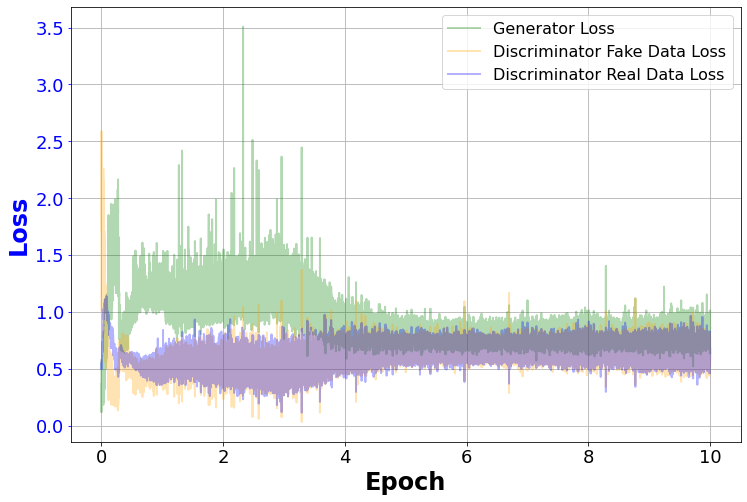

In [5]:
fig = disp_gan_learn_hist(path)#, losslim=2.5)

Found training logs:  ['/home/jtindall/WatChMaL/outputs/2021-01-08/gan_collapse_2/outputs/log_train_0.csv']
Index(['iteration', 'epoch', 'g_loss', 'd_loss_fake', 'd_loss_real'], dtype='object')


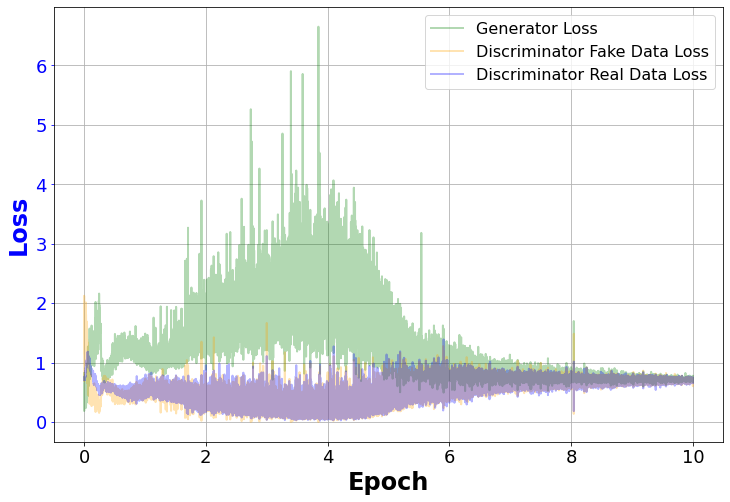

In [6]:
fig = disp_gan_learn_hist('/home/jtindall/WatChMaL/outputs/2021-01-08/gan_collapse_2/outputs')#, losslim=2.5)

Found training logs:  ['/home/jtindall/WatChMaL/outputs/2021-01-08/gan_collapse_3/outputs/log_train_0.csv']
Index(['iteration', 'epoch', 'g_loss', 'd_loss_fake', 'd_loss_real'], dtype='object')


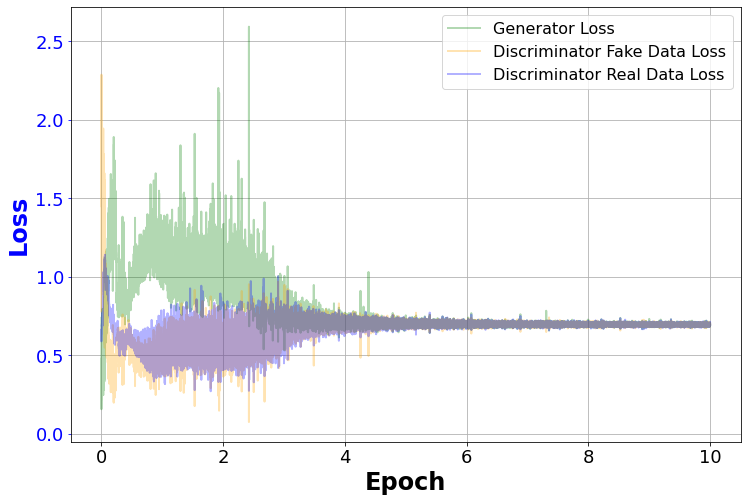

In [7]:
fig = disp_gan_learn_hist('/home/jtindall/WatChMaL/outputs/2021-01-08/gan_collapse_3/outputs')#, losslim=2.5)

Found training logs:  ['/home/jtindall/WatChMaL/outputs/2021-01-08/gan_collapse_4/outputs/log_train_0.csv']
Index(['iteration', 'epoch', 'g_loss', 'd_loss_fake', 'd_loss_real'], dtype='object')


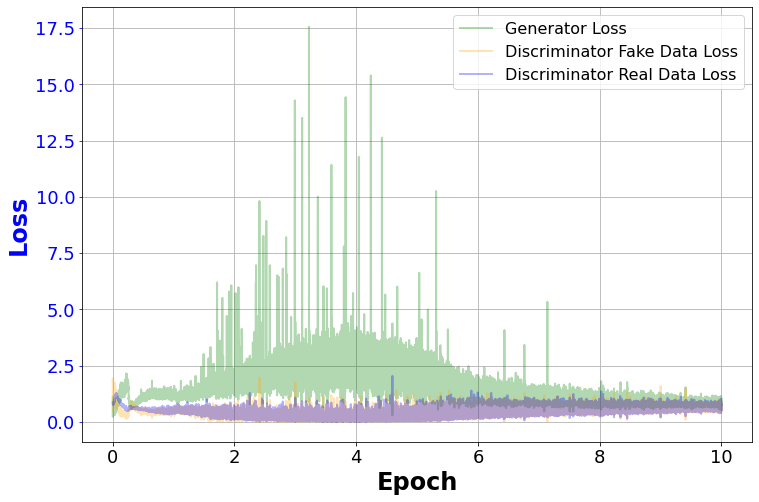

In [8]:
fig = disp_gan_learn_hist('/home/jtindall/WatChMaL/outputs/2021-01-08/gan_collapse_4/outputs')#, losslim=2.5)

In [9]:
image_batches = [np.load(fname,allow_pickle=True)['gen_imgs'] for fname in glob.glob(os.path.join(path,'imgs/*'))]
print(len(image_batches))

108


In [10]:
batch_grids=[]
for image_batch in image_batches:
    batch_grid = np.concatenate([np.pad(np.squeeze(img),2,mode='constant',constant_values=(np.nan,)) for img in image_batch[0:8]],axis=1)
    
    for row_index in range(1,8,1):
        image_row = np.concatenate([np.pad(np.squeeze(img),2,mode='constant',constant_values=(np.nan,)) for img in image_batch[row_index*8:(row_index+1)*8]],axis=1)
        batch_grid = np.concatenate((batch_grid,image_row),axis=0)
    
    batch_grids.append(batch_grid)

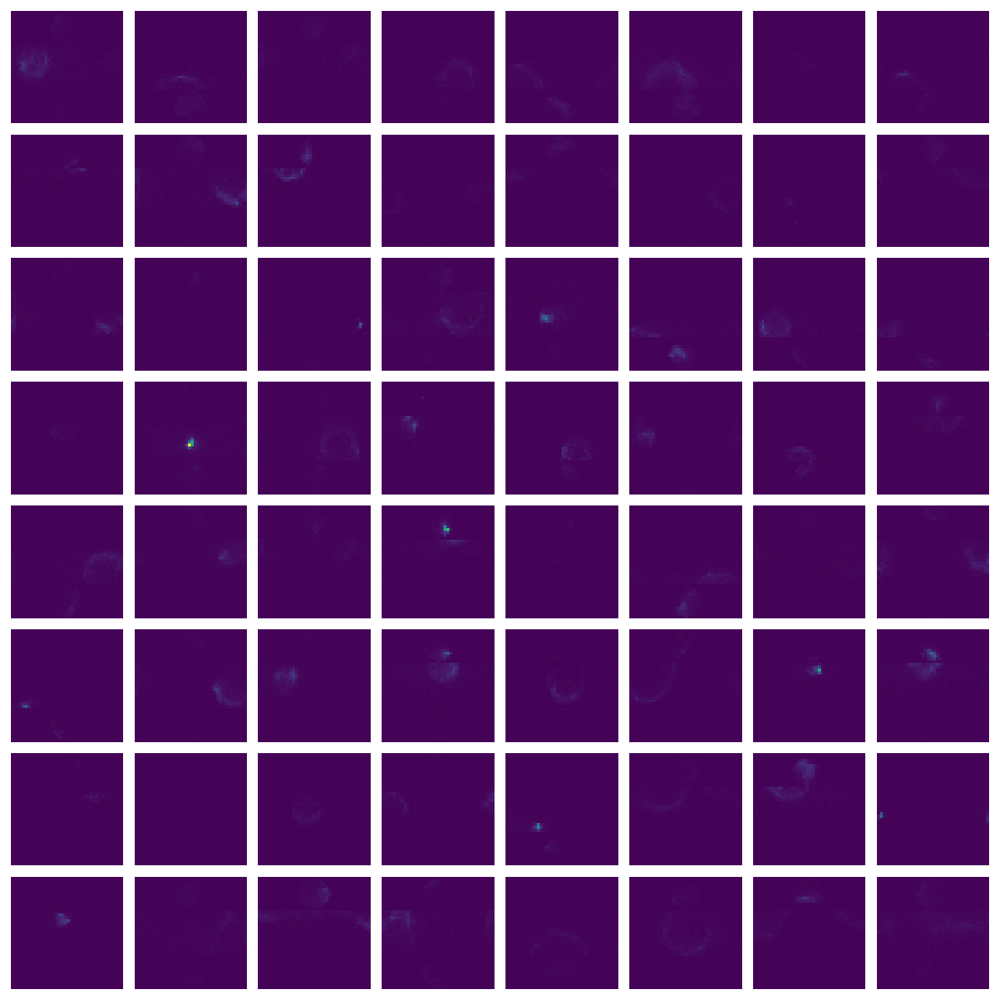

In [52]:
# Display animation of generated images
fig = plt.figure(figsize=(25,25))
plt.axis("off")
ims = [[plt.imshow(img, animated=True,cmap=plt.cm.viridis)] for img in batch_grids]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

In [13]:
def display_gen_imgs(path):
    print("Not Implemented")



In [76]:
def display_batch(image_batch, fig):
    batch_grid = np.concatenate([np.pad(np.squeeze(img),2,mode='constant',constant_values=(np.nan,)) for img in image_batch[0:8]], axis=1)
    
    for row_index in range(1,8,1):
        image_row = np.concatenate([np.pad(np.squeeze(img),2,mode='constant',constant_values=(np.nan,)) for img in image_batch[row_index*8:(row_index+1)*8]],axis=1)
        batch_grid = np.concatenate((batch_grid, image_row),axis=0)
    #plt.figure(figsize=(25,25))
    im = plt.imshow(batch_grid, animated=True,cmap=plt.cm.viridis)
    return [im]

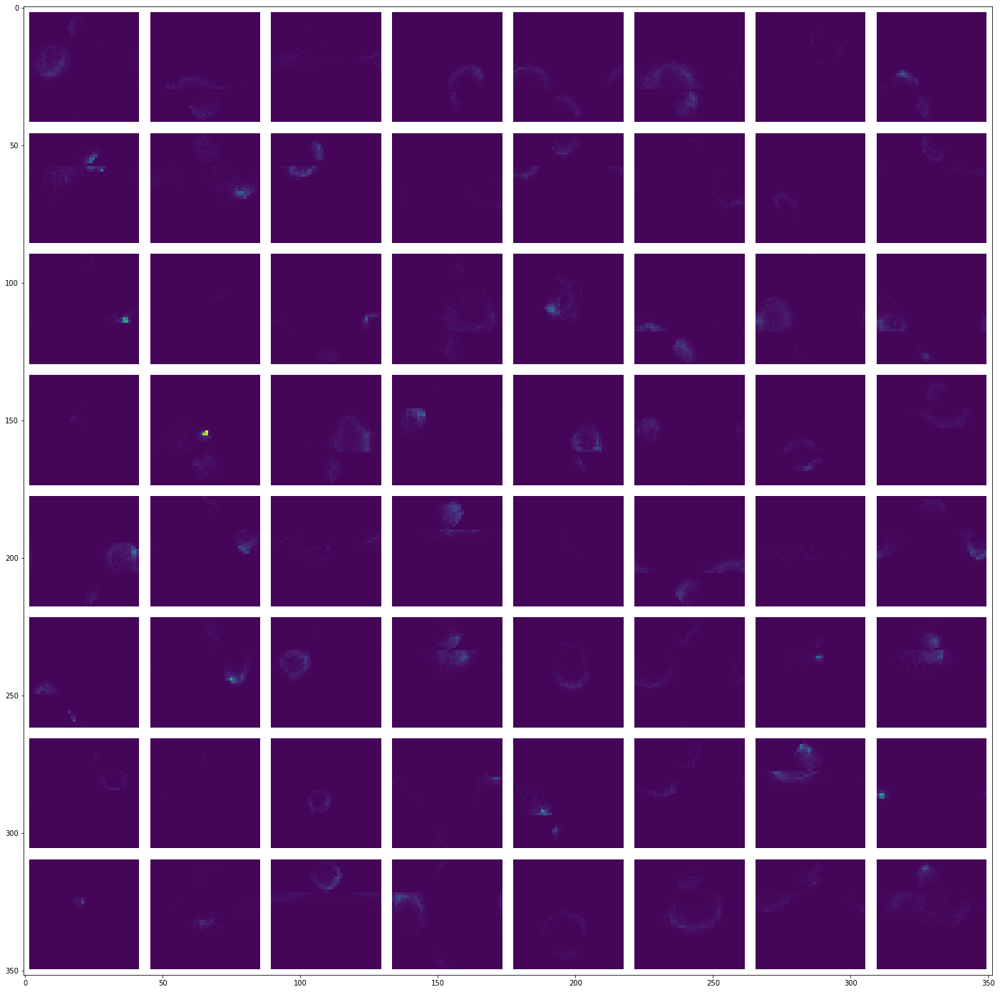

In [77]:
# Display animation of generated images
fig = plt.figure(figsize=(25,25))
sample_ims_1 = display_batch(image_batches[0], fig)
sample_ims_2 = display_batch(image_batches[1], fig)
sample_ims_3 = display_batch(image_batches[2], fig)
list_of_ims = [sample_ims_1, sample_ims_2, sample_ims_3]
ani = animation.ArtistAnimation(fig, list_of_ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

In [85]:
"""
def display_batch(image_batch, fig):
    fig = plt.figure(figsize=(50, 50))
    test_ims = []
    for i in range(64):
        sub = fig.add_subplot(8, 8, i + 1)
        im = sub.imshow(batch[i, 0, :, :], interpolation='nearest', animated=True)
        #print(type(im))
        test_ims.append(im)
    return test_ims
"""

In [121]:
def display_batch(image_batch, axes):
    ims = []
    for idx, ax in enumerate(axes.reshape(-1)):
        im = ax.imshow(image_batch[idx, 0, :, :], interpolation='nearest', animated=True)
        ims.append(im)
    return ims

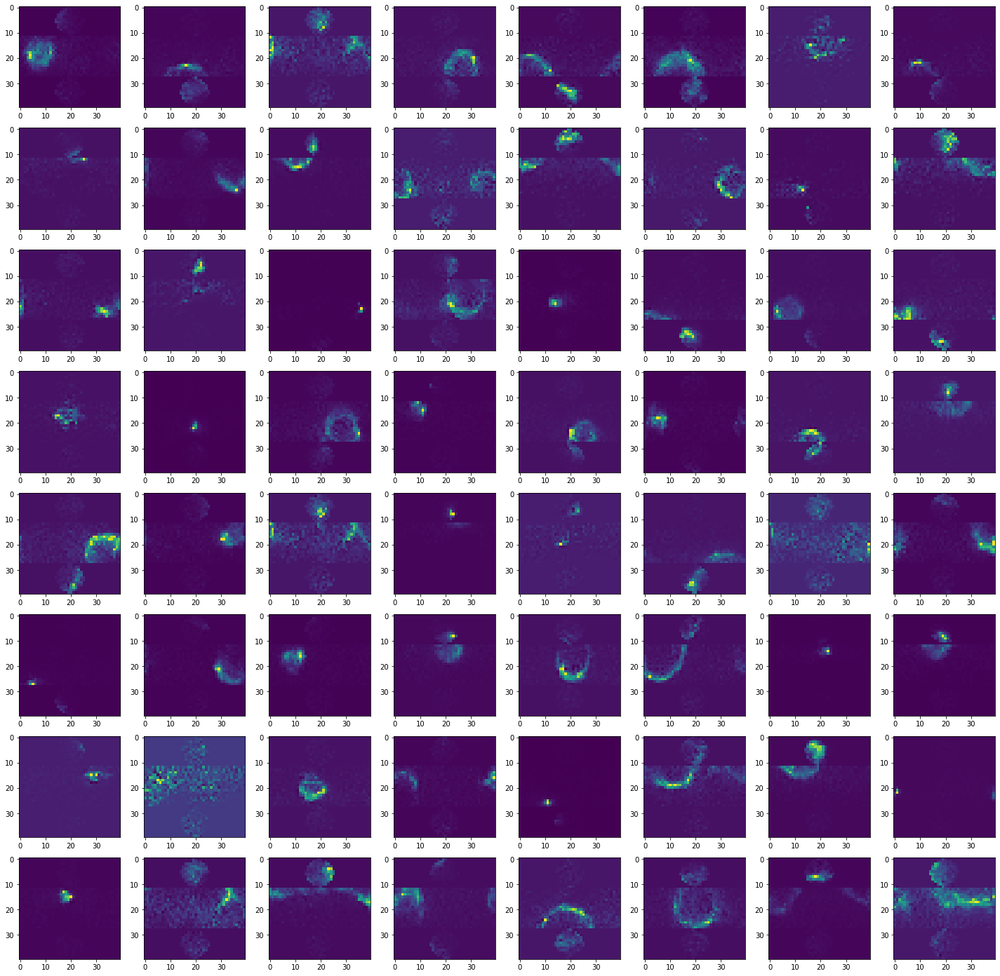

In [118]:
fig, axes = plt.subplots(8, 8, figsize=(25, 25))
display_batch(image_batches[-1], axes)
plt.show()

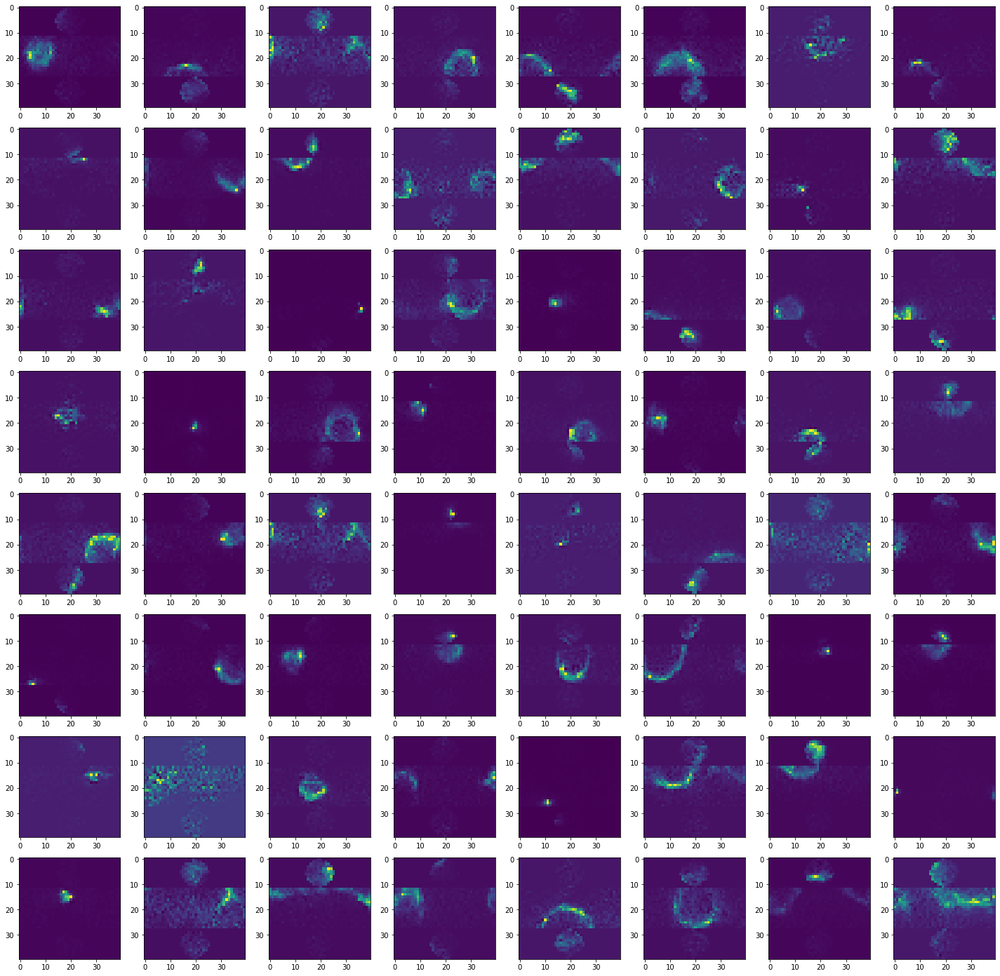

In [120]:
# Display animation of generated images
fig, axes = plt.subplots(8, 8, figsize=(25, 25)) #figsize=(25,25))
sample_ims_1 = display_batch(image_batches[0], axes)
sample_ims_2 = display_batch(image_batches[1], axes)
sample_ims_3 = display_batch(image_batches[2], axes)
list_of_ims = [sample_ims_1, sample_ims_2, sample_ims_3]
ani = animation.ArtistAnimation(fig, list_of_ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())